\Prueba para ver las cantidades de imágenes Inicialmente descargadas de Kaggle

In [ ]:
import os

# Ruta principal
base_dir = '/content/drive/MyDrive/ProyectoCESUMA/drawings'

# Extensiones válidas de imágenes
extensiones_validas = ('.jpg', '.jpeg', '.png', '.bmp', '.tiff')

# Contadores
total_imagenes = 0
conteo_por_carpeta = {}

# Recorrer todas las carpetas y subcarpetas
for root, dirs, files in os.walk(base_dir):
    count = sum(file.lower().endswith(extensiones_validas) for file in files)
    if count > 0:
        conteo_por_carpeta[root] = count
        total_imagenes += count

# Mostrar resultados
print(f"\n📦 Total de imágenes en '{base_dir}': {total_imagenes}\n")
print("📁 Conteo por subcarpeta:")
for carpeta, cantidad in conteo_por_carpeta.items():
    print(f"- {carpeta}: {cantidad} imágenes")



📦 Total de imágenes en '/content/drive/MyDrive/ProyectoCESUMA/drawings': 204

📁 Conteo por subcarpeta:
- /content/drive/MyDrive/ProyectoCESUMA/drawings/spiral/testing/parkinson: 15 imágenes
- /content/drive/MyDrive/ProyectoCESUMA/drawings/spiral/testing/healthy: 15 imágenes
- /content/drive/MyDrive/ProyectoCESUMA/drawings/spiral/training/healthy: 36 imágenes
- /content/drive/MyDrive/ProyectoCESUMA/drawings/spiral/training/parkinson: 36 imágenes
- /content/drive/MyDrive/ProyectoCESUMA/drawings/wave/training/healthy: 36 imágenes
- /content/drive/MyDrive/ProyectoCESUMA/drawings/wave/training/parkinson: 36 imágenes
- /content/drive/MyDrive/ProyectoCESUMA/drawings/wave/testing/parkinson: 15 imágenes
- /content/drive/MyDrive/ProyectoCESUMA/drawings/wave/testing/healthy: 15 imágenes


🧾 1. Instalación y Librerías

In [ ]:
!pip install tensorflow opencv-python matplotlib seaborn shap tf-explain

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.6/43.6 kB 1.3 MB/s eta 0:00:00


In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import EfficientNetB3
from tensorflow.keras.models import Model
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout, BatchNormalization
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from sklearn.metrics import confusion_matrix, classification_report, roc_auc_score

📁 2. Preparación del Dataset

In [ ]:
#Se borran las imágenes para volver a generarlas
import shutil
shutil.rmtree('/content/drive/MyDrive/ProyectoCESUMA/drawings_aumentado', ignore_errors=True)


Data augmentation

In [ ]:
import os
import shutil
from tensorflow.keras.preprocessing.image import ImageDataGenerator, img_to_array, load_img, save_img
import numpy as np
from tqdm import tqdm

# Configuración
carpeta_origen = '/content/drive/MyDrive/ProyectoCESUMA/drawings'
carpeta_destino = '/content/drive/MyDrive/ProyectoCESUMA/drawings_aumentado'
minimo_por_clase = 200  # Número mínimo de imágenes por subcarpeta

datagen = ImageDataGenerator(
    rotation_range=10,
    width_shift_range=0.10,
    height_shift_range=0.10,
    shear_range=0.08,
    zoom_range=[0.9, 1.1],
    brightness_range=(0.8, 1.1),
    channel_shift_range=10,
    horizontal_flip=True,   # Cambia a True si tiene sentido para el dibujo
    vertical_flip=False,
    fill_mode='nearest'
)


for tipo_dibujo in ['spiral', 'wave']:
    for split in ['training', 'testing']:
        for clase in ['healthy', 'parkinson']:
            ruta_origen = os.path.join(carpeta_origen, tipo_dibujo, split, clase)
            ruta_dest = os.path.join(carpeta_destino, tipo_dibujo, split, clase)
            os.makedirs(ruta_dest, exist_ok=True)

            # Listar imágenes originales
            imagenes = [f for f in os.listdir(ruta_origen) if f.lower().endswith(('.jpg','.jpeg','.png','.bmp','.tiff'))]
            n_originales = len(imagenes)
            total_necesarias = max(0, minimo_por_clase - n_originales)

            print(f"\n🖼️ {ruta_origen}: {n_originales} originales, generando {total_necesarias} aumentadas...")

            # Copiar originales (sin duplicados)
            for fname in imagenes:
                src = os.path.join(ruta_origen, fname)
                dst = os.path.join(ruta_dest, fname)
                if not os.path.exists(dst):
                    shutil.copy(src, dst)

            if total_necesarias <= 0:
                continue

            # Data augmentation: Generar las imágenes faltantes
            generadas = 0
            pbar = tqdm(total=total_necesarias, desc=f'Generando {clase} ({tipo_dibujo}/{split})')
            while generadas < total_necesarias:
                for fname in imagenes:
                    img_path = os.path.join(ruta_origen, fname)
                    img = load_img(img_path)
                    x = img_to_array(img)
                    x = np.expand_dims(x, axis=0)

                    for batch in datagen.flow(x, batch_size=1):
                        nombre_out = f"{os.path.splitext(fname)[0]}_aug{generadas}.png"
                        save_img(os.path.join(ruta_dest, nombre_out), batch[0].astype('uint8'))
                        generadas += 1
                        pbar.update(1)
                        if generadas >= total_necesarias:
                            break
                    if generadas >= total_necesarias:
                        break
            pbar.close()

print("\n✅ ¡Data augmentation completo! Todas las clases tienen al menos 350 imágenes.")


🖼️ /content/drive/MyDrive/ProyectoCESUMA/drawings/spiral/training/healthy: 36 originales, generando 164 aumentadas...


Generando healthy (spiral/training): 100%|██████████| 164/164 [00:06<00:00, 25.49it/s]



🖼️ /content/drive/MyDrive/ProyectoCESUMA/drawings/spiral/training/parkinson: 36 originales, generando 164 aumentadas...


Generando parkinson (spiral/training): 100%|██████████| 164/164 [00:06<00:00, 25.79it/s]



🖼️ /content/drive/MyDrive/ProyectoCESUMA/drawings/spiral/testing/healthy: 15 originales, generando 185 aumentadas...


Generando healthy (spiral/testing): 100%|██████████| 185/185 [00:07<00:00, 26.00it/s]



🖼️ /content/drive/MyDrive/ProyectoCESUMA/drawings/spiral/testing/parkinson: 15 originales, generando 185 aumentadas...


Generando parkinson (spiral/testing): 100%|██████████| 185/185 [00:07<00:00, 25.86it/s]



🖼️ /content/drive/MyDrive/ProyectoCESUMA/drawings/wave/training/healthy: 36 originales, generando 164 aumentadas...


Generando healthy (wave/training): 100%|██████████| 164/164 [00:11<00:00, 14.55it/s]



🖼️ /content/drive/MyDrive/ProyectoCESUMA/drawings/wave/training/parkinson: 36 originales, generando 164 aumentadas...


Generando parkinson (wave/training): 100%|██████████| 164/164 [00:14<00:00, 11.71it/s]



🖼️ /content/drive/MyDrive/ProyectoCESUMA/drawings/wave/testing/healthy: 15 originales, generando 185 aumentadas...


Generando healthy (wave/testing): 100%|██████████| 185/185 [00:16<00:00, 11.15it/s]



🖼️ /content/drive/MyDrive/ProyectoCESUMA/drawings/wave/testing/parkinson: 15 originales, generando 185 aumentadas...


Generando parkinson (wave/testing): 100%|██████████| 185/185 [00:12<00:00, 14.30it/s]


✅ ¡Data augmentation completo! Todas las clases tienen al menos 350 imágenes.


Bloque para visualizar imágenes originales vs. aumentadas

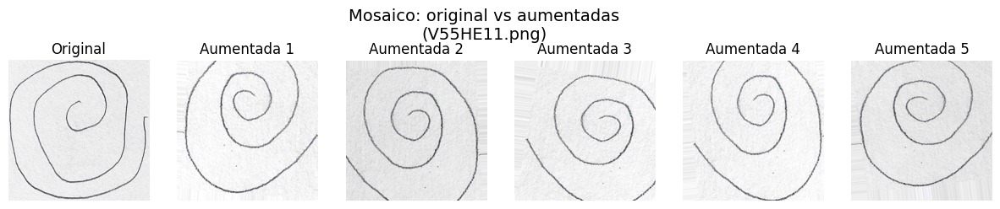

In [ ]:
import matplotlib.pyplot as plt
import random
from tensorflow.keras.preprocessing.image import load_img

# Cambia esto a la carpeta que quieras mostrar (por ejemplo, spiral/training/healthy)
carpeta_visualizar = '/content/drive/MyDrive/ProyectoCESUMA/drawings_aumentado/spiral/training/healthy'

# Lista de archivos de la carpeta
archivos = [f for f in os.listdir(carpeta_visualizar) if f.lower().endswith(('.jpg','.jpeg','.png','.bmp','.tiff'))]

# Elige una imagen original (sin '_aug' en el nombre)
originales = [f for f in archivos if '_aug' not in f]
if not originales:
    raise Exception("No se encontraron imágenes originales en la carpeta seleccionada.")
img_original = random.choice(originales)

# Elige 5 imágenes aumentadas (con '_aug' en el nombre y mismo prefijo que la original)
prefijo = os.path.splitext(img_original)[0]
aumentadas = [f for f in archivos if f.startswith(prefijo) and '_aug' in f]
if len(aumentadas) < 5:
    aumentadas = random.sample([f for f in archivos if '_aug' in f], 5)
else:
    aumentadas = random.sample(aumentadas, 5)

# Mostrar original + 5 aumentadas
plt.figure(figsize=(15,3))
plt.subplot(1,6,1)
plt.imshow(load_img(os.path.join(carpeta_visualizar, img_original)))
plt.title('Original')
plt.axis('off')
for i, fname in enumerate(aumentadas):
    plt.subplot(1,6,i+2)
    plt.imshow(load_img(os.path.join(carpeta_visualizar, fname)))
    plt.title(f'Aumentada {i+1}')
    plt.axis('off')
plt.suptitle(f"Mosaico: original vs aumentadas\n({img_original})", fontsize=14)
plt.show()


Verificar la cantidad

In [ ]:
import os

# Ruta principal
base_dir = '/content/drive/MyDrive/ProyectoCESUMA/drawings_aumentado'

# Extensiones válidas de imágenes
extensiones_validas = ('.jpg', '.jpeg', '.png', '.bmp', '.tiff')

# Contadores
total_imagenes = 0
conteo_por_carpeta = {}

# Recorrer todas las carpetas y subcarpetas
for root, dirs, files in os.walk(base_dir):
    count = sum(file.lower().endswith(extensiones_validas) for file in files)
    if count > 0:
        conteo_por_carpeta[root] = count
        total_imagenes += count

# Mostrar resultados
print(f"\n📦 Total de imágenes en '{base_dir}': {total_imagenes}\n")
print("📁 Conteo por subcarpeta:")
for carpeta, cantidad in conteo_por_carpeta.items():
    print(f"- {carpeta}: {cantidad} imágenes")


📦 Total de imágenes en '/content/drive/MyDrive/ProyectoCESUMA/drawings_aumentado': 1600

📁 Conteo por subcarpeta:
- /content/drive/MyDrive/ProyectoCESUMA/drawings_aumentado/spiral/training/healthy: 200 imágenes
- /content/drive/MyDrive/ProyectoCESUMA/drawings_aumentado/spiral/training/parkinson: 200 imágenes
- /content/drive/MyDrive/ProyectoCESUMA/drawings_aumentado/spiral/testing/healthy: 200 imágenes
- /content/drive/MyDrive/ProyectoCESUMA/drawings_aumentado/spiral/testing/parkinson: 200 imágenes
- /content/drive/MyDrive/ProyectoCESUMA/drawings_aumentado/wave/training/healthy: 200 imágenes
- /content/drive/MyDrive/ProyectoCESUMA/drawings_aumentado/wave/training/parkinson: 200 imágenes
- /content/drive/MyDrive/ProyectoCESUMA/drawings_aumentado/wave/testing/healthy: 200 imágenes
- /content/drive/MyDrive/ProyectoCESUMA/drawings_aumentado/wave/testing/parkinson: 200 imágenes


In [ ]:
import tensorflow as tf
import os

# Lista de rutas para carpetas de entrenamiento
train_dirs = [
    '/content/drive/MyDrive/ProyectoCESUMA/drawings_aumentado/spiral/training',
    '/content/drive/MyDrive/ProyectoCESUMA/drawings_aumentado/wave/training',
]

# Lista de rutas para carpetas de validación (testing en tu estructura)
test_dirs = [
    '/content/drive/MyDrive/ProyectoCESUMA/drawings_aumentado/spiral/testing',
    '/content/drive/MyDrive/ProyectoCESUMA/drawings_aumentado/wave/testing',

]

# Parámetros comunes
img_size = (300, 300)
batch_size = 32

# Función para cargar varios datasets y unirlos
def load_combined_dataset(directories, shuffle=True):
    combined_dataset = None
    for dir_path in directories:
        ds = tf.keras.utils.image_dataset_from_directory(
            dir_path,
            labels='inferred',
            label_mode='binary',
            image_size=img_size,
            batch_size=batch_size,
            shuffle=shuffle
        )
        if combined_dataset is None:
            combined_dataset = ds
        else:
            combined_dataset = combined_dataset.concatenate(ds)
    return combined_dataset

# Crear datasets
train_dataset = load_combined_dataset(train_dirs, shuffle=True)
val_dataset = load_combined_dataset(test_dirs, shuffle=False)

# Optimización con prefetch
train_dataset = train_dataset.prefetch(buffer_size=tf.data.AUTOTUNE)
val_dataset = val_dataset.prefetch(buffer_size=tf.data.AUTOTUNE)

Found 400 files belonging to 2 classes.
Found 400 files belonging to 2 classes.
Found 400 files belonging to 2 classes.
Found 400 files belonging to 2 classes.


In [ ]:
import os

# Cambia esto a la carpeta que quieras analizar
carpeta_base = '/content/drive/MyDrive/ProyectoCESUMA/drawings_aumentado'

# Extensiones válidas de imágenes
extensiones_validas = ('.jpg', '.jpeg', '.png', '.bmp', '.tiff')

resumen = []

for root, dirs, files in os.walk(carpeta_base):
    if not files:
        continue
    originales = [f for f in files if f.lower().endswith(extensiones_validas) and '_aug' not in f]
    aumentadas = [f for f in files if f.lower().endswith(extensiones_validas) and '_aug' in f]
    resumen.append({
        'carpeta': root,
        'originales': len(originales),
        'aumentadas': len(aumentadas),
        'total': len(originales) + len(aumentadas)
    })

print(f"{'Carpeta':70} | {'Originales':>10} | {'Aumentadas':>10} | {'Total':>6}")
print('-'*100)
for r in resumen:
    print(f"{r['carpeta']:70} | {r['originales']:10} | {r['aumentadas']:10} | {r['total']:6}")


Carpeta                                                                | Originales | Aumentadas |  Total
----------------------------------------------------------------------------------------------------
/content/drive/MyDrive/ProyectoCESUMA/drawings_aumentado/spiral/training/healthy |         36 |        164 |    200
/content/drive/MyDrive/ProyectoCESUMA/drawings_aumentado/spiral/training/parkinson |         36 |        164 |    200
/content/drive/MyDrive/ProyectoCESUMA/drawings_aumentado/spiral/testing/healthy |         15 |        185 |    200
/content/drive/MyDrive/ProyectoCESUMA/drawings_aumentado/spiral/testing/parkinson |         15 |        185 |    200
/content/drive/MyDrive/ProyectoCESUMA/drawings_aumentado/wave/training/healthy |         36 |        164 |    200
/content/drive/MyDrive/ProyectoCESUMA/drawings_aumentado/wave/training/parkinson |         36 |        164 |    200
/content/drive/MyDrive/ProyectoCESUMA/drawings_aumentado/wave/testing/healthy |         15 |     

<ipython-input-9-91d35b592d2e>:16: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  plt.title(class_names[int(labels[i].numpy())])


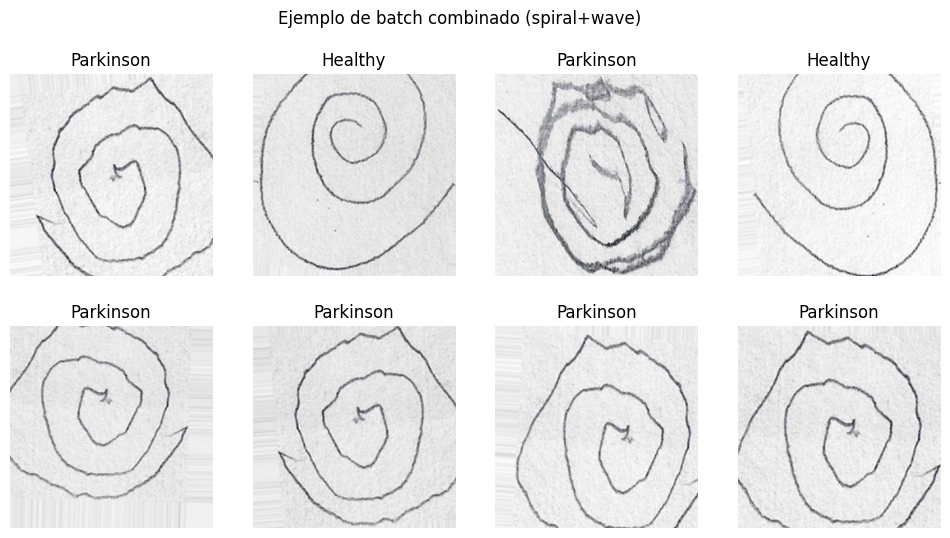

In [ ]:
import matplotlib.pyplot as plt

class_names = ["Healthy", "Parkinson"]

for images, labels in train_dataset.take(1):
    plt.figure(figsize=(12, 6))
    for i in range(8):
        ax = plt.subplot(2, 4, i+1)
        img_np = images[i].numpy()
        # Si la imagen es de un solo canal, la convierte a 2D para plt.imshow
        if img_np.shape[-1] == 1:
            img_np = img_np.squeeze(axis=-1)
            plt.imshow(img_np, cmap='gray')
        else:
            plt.imshow(img_np.astype('uint8'))
        plt.title(class_names[int(labels[i].numpy())])
        plt.axis("off")
    plt.suptitle("Ejemplo de batch combinado (spiral+wave)")
    plt.show()


🧠 3. Definición del Modelo CNN (EfficientNetB3)

In [ ]:
from tensorflow.keras.applications import EfficientNetB3
from tensorflow.keras.layers import GlobalAveragePooling2D, BatchNormalization, Dropout, Dense
from tensorflow.keras.models import Model
from tensorflow.keras import regularizers

# Carga base EfficientNetB3 con pesos ImageNet
base_model = EfficientNetB3(
    weights='imagenet',
    include_top=False,
    input_shape=(300, 300, 3)
)
base_model.trainable = False  # Congelar pesos preentrenados

# Capas superiores
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = BatchNormalization()(x)
x = Dropout(0.5)(x)  # Mucho dropout para evitar sobreajuste, puedes probar también con 0.5 o 0.7
output = Dense(1, activation='sigmoid', kernel_regularizer=regularizers.l2(0.01))(x)

model = Model(inputs=base_model.input, outputs=output)

# Compilar modelo (¡falta la coma!)
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=3e-5),  # <--- aquí la coma
    loss='binary_crossentropy',
    metrics=['accuracy']
)


43941136/43941136 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


🏋️ 4. Entrenamiento del Modelo

In [ ]:
# --- EXTRAER LAS ETIQUETAS DE TRAIN ---
import numpy as np

y_train_labels = []
for batch in train_dataset:
    _, labels = batch
    y_train_labels.extend(labels.numpy().flatten())
y_train_labels = np.array(y_train_labels).astype(int)


In [ ]:
from sklearn.utils.class_weight import compute_class_weight

weights = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(y_train_labels),
    y=y_train_labels
)
class_weight_dict = dict(enumerate(weights))
print("Pesos por clase:", class_weight_dict)
# Ejemplo posible: {0: 1.0, 1: 1.2}


Pesos por clase: {0: np.float64(1.0), 1: np.float64(1.0)}


In [ ]:
early_stopping = EarlyStopping(monitor='val_accuracy', patience=10, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(factor=0.5, patience=3, verbose=1)
checkpoint = ModelCheckpoint('mejor_modelo.keras', save_best_only=True, monitor='val_accuracy', verbose=1)

history = model.fit(
    train_dataset,
    validation_data=val_dataset,
    epochs=100,
    callbacks=[early_stopping, reduce_lr, checkpoint],
    class_weight=class_weight_dict
)

Epoch 1/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 773ms/step - accuracy: 0.5650 - loss: 0.9168
Epoch 1: val_accuracy improved from -inf to 0.58000, saving model to mejor_modelo.keras
26/26 ━━━━━━━━━━━━━━━━━━━━ 74s 1s/step - accuracy: 0.5627 - loss: 0.9222 - val_accuracy: 0.5800 - val_loss: 0.6880 - learning_rate: 3.0000e-05
Epoch 2/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - accuracy: 0.5528 - loss: 0.9387 
Epoch 2: val_accuracy did not improve from 0.58000
26/26 ━━━━━━━━━━━━━━━━━━━━ 5s 204ms/step - accuracy: 0.5500 - loss: 0.9445 - val_accuracy: 0.5400 - val_loss: 0.6730 - learning_rate: 3.0000e-05
Epoch 3/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - accuracy: 0.6423 - loss: 0.7869 
Epoch 3: val_accuracy did not improve from 0.58000
26/26 ━━━━━━━━━━━━━━━━━━━━ 5s 204ms/step - accuracy: 0.6389 - loss: 0.7937 - val_accuracy: 0.5238 - val_loss: 0.6607 - learning_rate: 3.0000e-05
Epoch 4/100
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - accuracy: 0.6303 - loss: 0.8015 
Epoch 4: val_accuracy did not

Fine-tuning

In [ ]:
# Tras entrenar con base_model.trainable = False
base_model.trainable = True
# Descongelar solo las últimas N capas
for layer in base_model.layers[:-60]:
    layer.trainable = False

model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-5),  # menor LR
              loss='binary_crossentropy',
              metrics=['accuracy'])
history_finetune = model.fit(
    train_dataset,
    validation_data=val_dataset,
    epochs=10,
    callbacks=[early_stopping, reduce_lr, checkpoint]
)


Epoch 1/10
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 943ms/step - accuracy: 0.7347 - loss: 0.6543
Epoch 1: val_accuracy did not improve from 0.93375
26/26 ━━━━━━━━━━━━━━━━━━━━ 86s 2s/step - accuracy: 0.7339 - loss: 0.6543 - val_accuracy: 0.9137 - val_loss: 0.3282 - learning_rate: 1.0000e-05
Epoch 2/10
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step - accuracy: 0.8200 - loss: 0.4243
Epoch 2: val_accuracy did not improve from 0.93375
26/26 ━━━━━━━━━━━━━━━━━━━━ 6s 237ms/step - accuracy: 0.8204 - loss: 0.4237 - val_accuracy: 0.8750 - val_loss: 0.3549 - learning_rate: 1.0000e-05
Epoch 3/10
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - accuracy: 0.8799 - loss: 0.2934
Epoch 3: val_accuracy did not improve from 0.93375
26/26 ━━━━━━━━━━━━━━━━━━━━ 6s 238ms/step - accuracy: 0.8801 - loss: 0.2931 - val_accuracy: 0.8263 - val_loss: 0.3834 - learning_rate: 1.0000e-05
Epoch 4/10
26/26 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step - accuracy: 0.9244 - loss: 0.2204
Epoch 4: ReduceLROnPlateau reducing learning rate to 4.999999873689376

Ajustar el umbral de decisión

In [ ]:
# Suponiendo que ya tienes tus datos de validación
y_probs = model.predict(val_dataset)
y_true = np.concatenate([y.numpy() for x, y in val_dataset], axis=0).astype(int)

# Usar umbral 0.5 (por defecto)
y_pred_05 = (y_probs >= 0.5).astype(int).flatten()

# Usar umbral 0.4 (más sensible a Parkinson)
y_pred_04 = (y_probs >= 0.4).astype(int).flatten()

from sklearn.metrics import classification_report

print("Reporte con umbral 0.5:")
print(classification_report(y_true, y_pred_05))

print("Reporte con umbral 0.4:")
print(classification_report(y_true, y_pred_04))


26/26 ━━━━━━━━━━━━━━━━━━━━ 18s 412ms/step
Reporte con umbral 0.5:
              precision    recall  f1-score   support

           0       0.87      0.98      0.92       400
           1       0.97      0.85      0.91       400

    accuracy                           0.91       800
   macro avg       0.92      0.91      0.91       800
weighted avg       0.92      0.91      0.91       800

Reporte con umbral 0.4:
              precision    recall  f1-score   support

           0       0.94      0.92      0.93       400
           1       0.92      0.94      0.93       400

    accuracy                           0.93       800
   macro avg       0.93      0.93      0.93       800
weighted avg       0.93      0.93      0.93       800



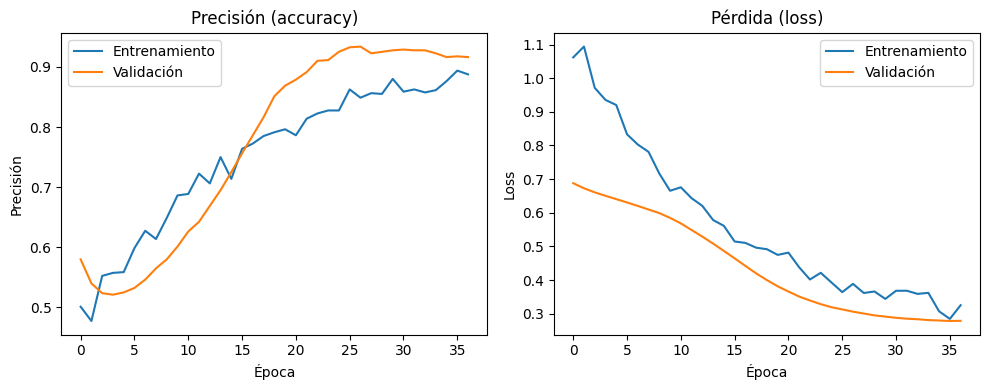

In [ ]:
import matplotlib.pyplot as plt

# Gráfica de Accuracy
plt.figure(figsize=(10,4))
plt.subplot(1,2,1)
plt.plot(history.history['accuracy'], label='Entrenamiento')
plt.plot(history.history['val_accuracy'], label='Validación')
plt.title('Precisión (accuracy)')
plt.xlabel('Época')
plt.ylabel('Precisión')
plt.legend()

# Gráfica de Loss
plt.subplot(1,2,2)
plt.plot(history.history['loss'], label='Entrenamiento')
plt.plot(history.history['val_loss'], label='Validación')
plt.title('Pérdida (loss)')
plt.xlabel('Época')
plt.ylabel('Loss')
plt.legend()
plt.tight_layout()
plt.show()


📊 5. Evaluación del Modelo

26/26 ━━━━━━━━━━━━━━━━━━━━ 3s 102ms/step
              precision    recall  f1-score   support

           0       0.95      0.89      0.91       400
           1       0.89      0.95      0.92       400

    accuracy                           0.92       800
   macro avg       0.92      0.92      0.92       800
weighted avg       0.92      0.92      0.92       800

AUC Score: 0.9700000000000001


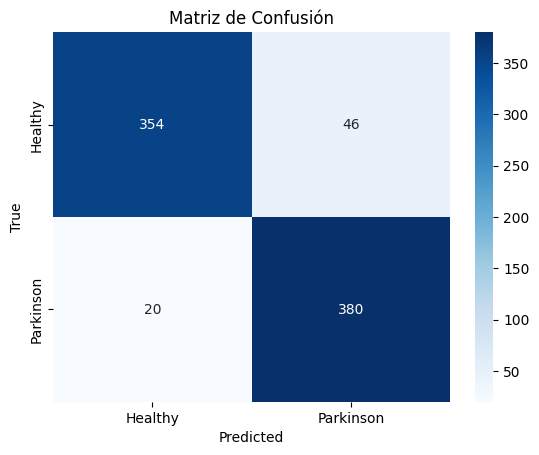

In [ ]:
# Predicción sobre val_dataset (que ya está cargado y funcionando)
#y_probs = model.predict(val_dataset)
#y_pred = (y_probs > 0.5).astype(int).flatten()

y_probs = model.predict(val_dataset)
y_pred = (y_probs > 0.35).astype(int).flatten()  # threshold más bajo


# Obtener etiquetas reales desde val_dataset
y_true = np.concatenate([y.numpy() for x, y in val_dataset], axis=0).astype(int)

# Evaluación
from sklearn.metrics import classification_report, roc_auc_score, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

print(classification_report(y_true, y_pred))
print("AUC Score:", roc_auc_score(y_true, y_probs))

# Matriz de confusión
cm = confusion_matrix(y_true, y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Healthy', 'Parkinson'], yticklabels=['Healthy', 'Parkinson'])
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Matriz de Confusión")
plt.show()

26/26 ━━━━━━━━━━━━━━━━━━━━ 3s 101ms/step
              precision    recall  f1-score   support

           0       0.95      0.89      0.91       400
           1       0.89      0.95      0.92       400

    accuracy                           0.92       800
   macro avg       0.92      0.92      0.92       800
weighted avg       0.92      0.92      0.92       800

AUC Score: 0.9700000000000001


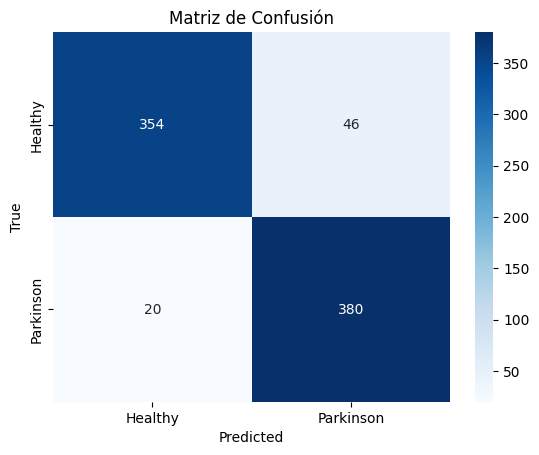

In [ ]:
# Predicción sobre val_dataset (que ya está cargado y funcionando)
y_probs = model.predict(val_dataset)

# CAMBIA el threshold aquí (por ejemplo, a 0.35 para buscar más recall en Parkinson)
y_pred = (y_probs > 0.35).astype(int).flatten()  # <--- AQUÍ puedes jugar con 0.3, 0.4, etc

# Obtener etiquetas reales desde val_dataset
y_true = np.concatenate([y.numpy() for x, y in val_dataset], axis=0).astype(int)

# Evaluación
from sklearn.metrics import classification_report, roc_auc_score, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

print(classification_report(y_true, y_pred))
print("AUC Score:", roc_auc_score(y_true, y_probs))

# Matriz de confusión
cm = confusion_matrix(y_true, y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Healthy', 'Parkinson'], yticklabels=['Healthy', 'Parkinson'])
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Matriz de Confusión")
plt.show()


🧠 6. Grad-CAM: Interpretabilidad Visual

/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: [['input_layer']]
Received: inputs=Tensor(shape=(1, 300, 300, 3))
  warnings.warn(msg)


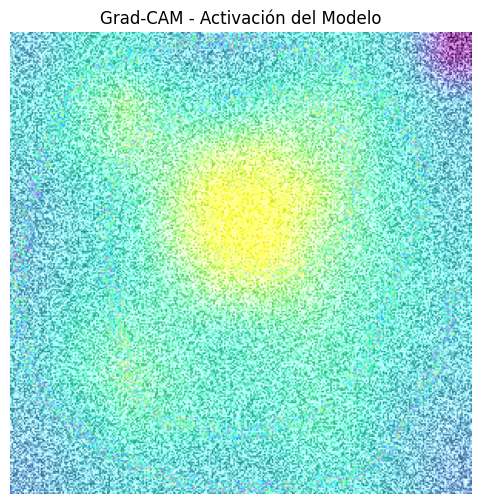

✅ Grad-CAM guardado en: /content/gradcam_result.png


In [ ]:
from tf_explain.core.grad_cam import GradCAM
import matplotlib.pyplot as plt
import numpy as np
from tensorflow.keras.models import load_model
import tensorflow as tf
import cv2

# 1. Cargar el modelo fine-tuned
model = load_model('mejor_modelo.keras')

# 2. Tomar una imagen de val_dataset
for image_batch, label_batch in val_dataset.take(1):
    image = image_batch[0].numpy()
    label = label_batch[0].numpy()
    break

# 3. Expandir dimensiones para adaptarlo al modelo
input_image = np.expand_dims(image, axis=0)

# 4. Crear el objeto GradCAM
explainer = GradCAM()

# 5. Ejecutar Grad-CAM especificando la capa convolucional final de EfficientNetB3
# (en EfficientNetB3, la capa se llama 'top_conv')
grid = explainer.explain(
    validation_data=(input_image, None),
    model=model,
    class_index=0,              # Cambia a 1 si quieres Grad-CAM para Parkinson
    layer_name="block7a_project_bn"      # Capa convolucional válida de EfficientNetB3
)

# 6. Mostrar el resultado
plt.figure(figsize=(6, 6))
plt.imshow(grid)
plt.axis("off")
plt.title("Grad-CAM - Activación del Modelo")
plt.show()

# 7. (Opcional) Guardar imagen
output_path = "/content/gradcam_result.png"
cv2.imwrite(output_path, cv2.cvtColor(grid, cv2.COLOR_RGB2BGR))
print(f"✅ Grad-CAM guardado en: {output_path}")

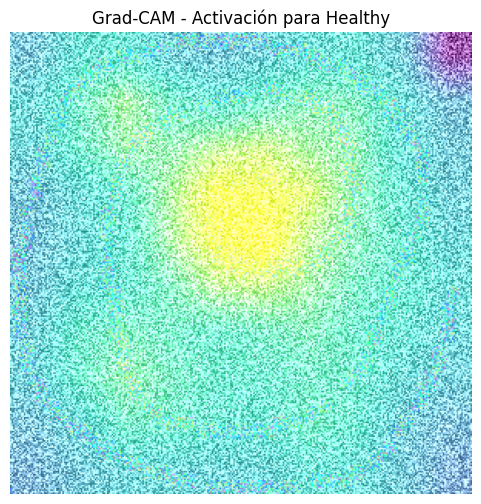

✅ Grad-CAM para Healthy guardado en: /content/gradcam_healthy.png


In [ ]:
from tf_explain.core.grad_cam import GradCAM
import matplotlib.pyplot as plt
import numpy as np
from tensorflow.keras.models import load_model
import tensorflow as tf
import cv2

# Cargar modelo
model = load_model('mejor_modelo.keras')

# Buscar una imagen de clase Healthy (label = 0)
for image, label in val_dataset.unbatch():
    if label.numpy() == 0:
        input_image = np.expand_dims(image.numpy(), axis=0)
        break

# Crear objeto GradCAM
explainer = GradCAM()
grid = explainer.explain(
    validation_data=(input_image, None),
    model=model,
    class_index=0,  # SIEMPRE usar 0 si tu salida es sigmoid
    layer_name="block7a_project_bn"
)

# Mostrar
plt.figure(figsize=(6, 6))
plt.imshow(grid)
plt.axis("off")
plt.title("Grad-CAM - Activación para Healthy")
plt.show()

# Guardar imagen
cv2.imwrite("/content/gradcam_healthy.png", cv2.cvtColor(grid, cv2.COLOR_RGB2BGR))
print("✅ Grad-CAM para Healthy guardado en: /content/gradcam_healthy.png")


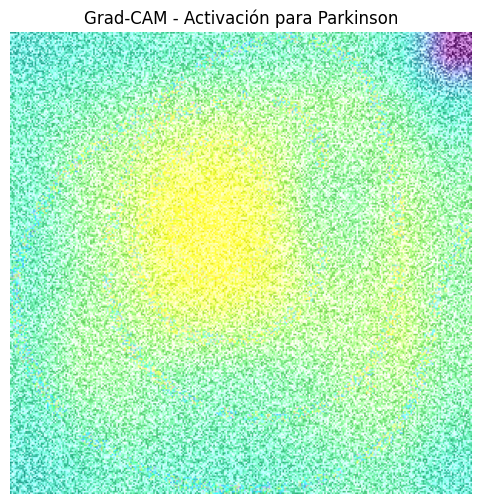

✅ Grad-CAM para Parkinson guardado en: /content/gradcam_parkinson.png


In [ ]:
from tf_explain.core.grad_cam import GradCAM
import matplotlib.pyplot as plt
import numpy as np
from tensorflow.keras.models import load_model
import tensorflow as tf
import cv2

# Cargar modelo
model = load_model('mejor_modelo.keras')

# Buscar una imagen de clase Parkinson (label = 1)
for image, label in val_dataset.unbatch():
    if label.numpy() == 1:
        input_image = np.expand_dims(image.numpy(), axis=0)
        break

# Crear objeto GradCAM
explainer = GradCAM()
grid = explainer.explain(
    validation_data=(input_image, None),
    model=model,
    class_index=0,  # AUNQUE sea Parkinson, usamos 0 por arquitectura sigmoid
    layer_name="block7a_project_bn"
)

# Mostrar
plt.figure(figsize=(6, 6))
plt.imshow(grid)
plt.axis("off")
plt.title("Grad-CAM - Activación para Parkinson")
plt.show()

# Guardar imagen
cv2.imwrite("/content/gradcam_parkinson.png", cv2.cvtColor(grid, cv2.COLOR_RGB2BGR))
print("✅ Grad-CAM para Parkinson guardado en: /content/gradcam_parkinson.png")

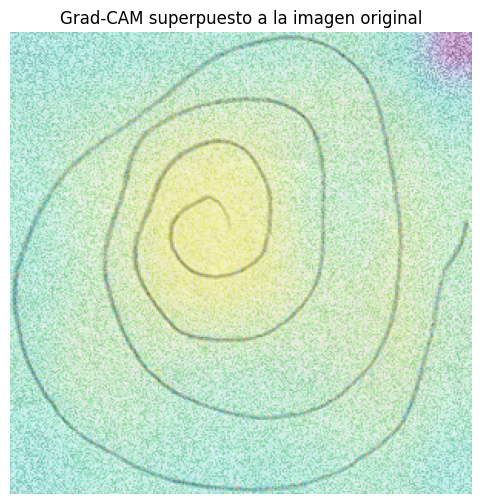

In [ ]:
# Supón que tienes 'image' como la imagen original y 'grid' como la Grad-CAM
import matplotlib.pyplot as plt

# Normalizar la imagen original si es necesario
image_norm = (image - np.min(image)) / (np.max(image) - np.min(image))

plt.figure(figsize=(6, 6))
plt.imshow(image_norm)
plt.imshow(grid, cmap='jet', alpha=0.5)  # 'alpha' ajusta la transparencia
plt.axis("off")
plt.title("Grad-CAM superpuesto a la imagen original")
plt.show()


Integrated Gradients

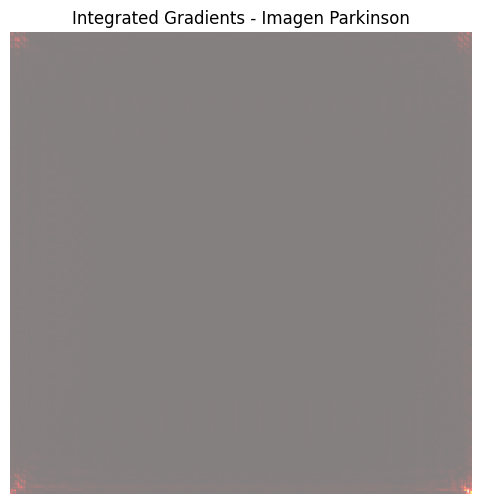

✅ Imagen guardada: /content/integrated_gradients_parkinson.png


In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model

# Función para calcular Integrated Gradients
def integrated_gradients(model, input_image, baseline=None, steps=50, batch_size=16): # Added batch_size
    if baseline is None:
        baseline = np.zeros_like(input_image)

    # Interpolaciones entre baseline y input
    interpolated_steps = [
        baseline + (float(i) / steps) * (input_image - baseline)
        for i in range(steps + 1)
    ]

    # Calcular gradientes en batches más pequeños
    all_grads = []
    for i in range(0, len(interpolated_steps), batch_size):
        batch_interpolated = interpolated_steps[i : i + batch_size]
        batch_interpolated = np.concatenate(batch_interpolated, axis=0)
        batch_interpolated = tf.convert_to_tensor(batch_interpolated)

        with tf.GradientTape() as tape:
            tape.watch(batch_interpolated)
            preds = model(batch_interpolated)
            # Ensure we target the correct output node for your model (sigmoid output has shape (None, 1))
            # Accessing preds[:, 0] is correct for a binary classification model with sigmoid output.
            target = preds[:, 0]

        batch_grads = tape.gradient(target, batch_interpolated).numpy()
        all_grads.append(batch_grads)

    grads = np.concatenate(all_grads, axis=0)

    avg_grads = np.mean(grads, axis=0)

    integrated_grads = (input_image - baseline) * avg_grads
    return integrated_grads

# 1. Cargar modelo y tomar imagen de clase Parkinson
model = load_model('mejor_modelo.keras')

for x, y in val_dataset.unbatch():
    if y.numpy() == 1:
        img = x.numpy().astype(np.float32)
        break

img = np.clip(img, 0, 1)
if img.shape[-1] == 1:
    img = np.repeat(img, 3, axis=-1)
img_batch = np.expand_dims(img, axis=0)

# 2. Calcular IG con batching
# Pass the desired batch_size to the function
# Reduced batch_size to mitigate OOM error
ig_attributions = integrated_gradients(model, img_batch, steps=50, batch_size=8)

# 3. Visualizar
attribution_map = np.sum(np.abs(ig_attributions[0]), axis=-1)

plt.figure(figsize=(6, 6))
plt.imshow(img)
plt.imshow(attribution_map, cmap='hot', alpha=0.5)
plt.title("Integrated Gradients - Imagen Parkinson")
plt.axis('off')
plt.savefig("/content/integrated_gradients_parkinson.png", bbox_inches='tight', dpi=300)
plt.show()

print("✅ Imagen guardada: /content/integrated_gradients_parkinson.png")

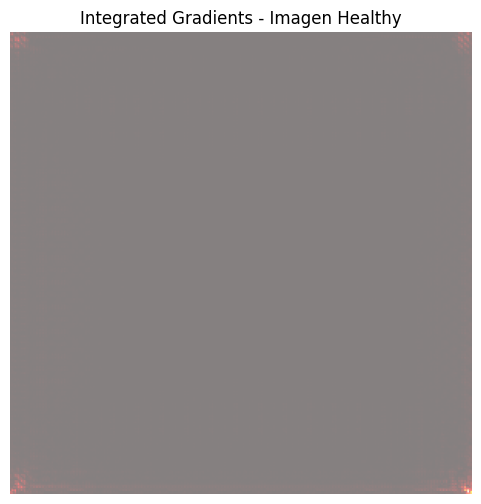

✅ Imagen guardada: /content/integrated_gradients_healthy.png


In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model

# Función para calcular Integrated Gradients
# Se remueve el batch_size interno para procesar cada paso individualmente
def integrated_gradients(model, input_image, baseline=None, steps=50):
    # input_image shape: (1, 300, 300, 3)
    if baseline is None:
        baseline = np.zeros_like(input_image)
    # Trabaja solo con la imagen, sin batch extra
    img = input_image[0]
    base = baseline[0]

    interpolated_steps = [
        base + (float(i) / steps) * (img - base)
        for i in range(steps + 1)
    ]

    all_grads = []
    for interpolated_image in interpolated_steps:
        interpolated_image_batch = tf.convert_to_tensor(np.expand_dims(interpolated_image, axis=0))  # (1, 300, 300, 3)
        with tf.GradientTape() as tape:
            tape.watch(interpolated_image_batch)
            preds = model(interpolated_image_batch)
            target = preds[:, 0]
        batch_grads = tape.gradient(target, interpolated_image_batch).numpy()
        all_grads.append(batch_grads[0])
    grads = np.stack(all_grads, axis=0)
    avg_grads = np.mean(grads, axis=0)
    integrated_grads = (img - base) * avg_grads
    # Para devolver igual que antes:
    integrated_grads = np.expand_dims(integrated_grads, axis=0)
    return integrated_grads



# 1. Cargar modelo y tomar imagen de clase Healthy (0)
model = tf.keras.models.load_model('mejor_modelo.keras')

for x, y in val_dataset.unbatch():
    if y.numpy() == 0:
        img = x.numpy().astype(np.float32)
        break

img = np.clip(img, 0, 1)
if img.shape[-1] == 1:
    img = np.repeat(img, 3, axis=-1)

img_batch = np.expand_dims(img, axis=0)

# 2. Calcular IG sin batch_size interno
# Puedes ajustar 'steps' si aún tienes problemas de memoria (reduce steps)
ig_attributions = integrated_gradients(model, img_batch, steps=50)

# 3. Visualizar
attribution_map = np.sum(np.abs(ig_attributions[0]), axis=-1)

plt.figure(figsize=(6, 6))
plt.imshow(img)
plt.imshow(attribution_map, cmap='hot', alpha=0.5)
plt.title("Integrated Gradients - Imagen Healthy")
plt.axis('off')
plt.savefig("/content/integrated_gradients_healthy.png", bbox_inches='tight', dpi=300)
plt.show()

print("✅ Imagen guardada: /content/integrated_gradients_healthy.png")

Gráfico comparativo

Runtime error setting memory growth: Physical devices cannot be modified after being initialized


<ipython-input-30-c6102c61946c>:86: UserWarning: Glyph 129504 (\N{BRAIN}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-30-c6102c61946c>:87: UserWarning: Glyph 129504 (\N{BRAIN}) missing from font(s) DejaVu Sans.
  plt.savefig("/content/IG_comparativo_healthy_vs_parkinson.png", dpi=300, bbox_inches='tight')
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129504 (\N{BRAIN}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


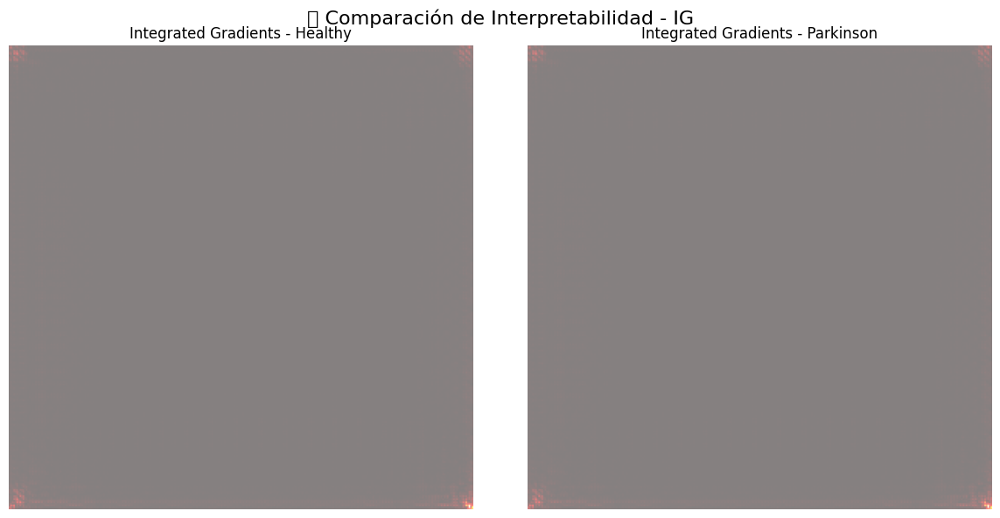

✅ Imagen comparativa guardada: /content/IG_comparativo_healthy_vs_parkinson.png


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf

# Clear the Keras session and enable memory growth before loading the model
tf.keras.backend.clear_session()
gpus = tf.config.list_physical_devices('GPU')
if gpus:
  try:
    # Enable memory growth on the first GPU
    tf.config.experimental.set_memory_growth(gpus[0], True)
    print("Memory growth enabled for the GPU.")
  except RuntimeError as e:
    # Memory growth must be set before GPUs have been initialized
    print(f"Runtime error setting memory growth: {e}")
    pass


# 1. Cargar modelo
model = tf.keras.models.load_model('mejor_modelo.keras')

# 2. Función de Integrated Gradients
def integrated_gradients(model, input_image, baseline=None, steps=50):
    if baseline is None:
        baseline = np.zeros_like(input_image)
    all_grads = []
    for alpha in np.linspace(0, 1, steps+1):
        interpolated = baseline + alpha * (input_image - baseline)
        interpolated_tensor = tf.convert_to_tensor(interpolated)
        with tf.GradientTape() as tape:
            tape.watch(interpolated_tensor)
            preds = model(interpolated_tensor)
            target = preds[:, 0]  # clase 0 por default, ajusta si quieres la 1
        grads = tape.gradient(target, interpolated_tensor).numpy()
        all_grads.append(grads[0])  # [0] porque interpolated tiene shape (1, ...)
    avg_grads = np.mean(all_grads, axis=0)
    integrated_grads = (input_image - baseline) * avg_grads
    return integrated_grads


# 3. Obtener una imagen Healthy (clase 0)
for x, y in val_dataset.unbatch():
    if y.numpy() == 0:
        healthy_img = x.numpy().astype(np.float32)
        break

# 4. Obtener una imagen Parkinson (clase 1)
for x, y in val_dataset.unbatch():
    if y.numpy() == 1:
        parkinson_img = x.numpy().astype(np.float32)
        break

# 5. Preprocess both images
def preprocess(img):
    img = np.clip(img, 0, 1)
    if img.shape[-1] == 1:
        img = np.repeat(img, 3, axis=-1)
    return np.expand_dims(img, axis=0)

healthy_batch = preprocess(healthy_img)
parkinson_batch = preprocess(parkinson_img)

# 6. Calcular attributions con menos steps
# REDUCED steps to reduce memory usage
attr_healthy = integrated_gradients(model, healthy_batch, steps=20)
attr_parkinson = integrated_gradients(model, parkinson_batch, steps=20)

# 7. Extraer mapas 2D
map_healthy = np.sum(np.abs(attr_healthy[0]), axis=-1)
map_parkinson = np.sum(np.abs(attr_parkinson[0]), axis=-1)

# 8. Visualizar comparativamente
fig, axs = plt.subplots(1, 2, figsize=(12, 6))

axs[0].imshow(healthy_img)
axs[0].imshow(map_healthy, cmap='hot', alpha=0.5)
axs[0].set_title("Integrated Gradients - Healthy")
axs[0].axis('off')

axs[1].imshow(parkinson_img)
axs[1].imshow(map_parkinson, cmap='hot', alpha=0.5)
axs[1].set_title("Integrated Gradients - Parkinson")
axs[1].axis('off')

plt.suptitle("🧠 Comparación de Interpretabilidad - IG", fontsize=16)
plt.tight_layout()
plt.savefig("/content/IG_comparativo_healthy_vs_parkinson.png", dpi=300, bbox_inches='tight')
plt.show()

print("✅ Imagen comparativa guardada: /content/IG_comparativo_healthy_vs_parkinson.png")

Grad-CAM

/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: [['input_layer']]
Received: inputs=Tensor(shape=(1, 300, 300, 3))
  warnings.warn(msg)
<ipython-input-31-a104e012e54f>:51: UserWarning: Glyph 129504 (\N{BRAIN}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-31-a104e012e54f>:52: UserWarning: Glyph 129504 (\N{BRAIN}) missing from font(s) DejaVu Sans.
  plt.savefig("/content/gradcam_comparativo_healthy_vs_parkinson.png", dpi=300, bbox_inches='tight')


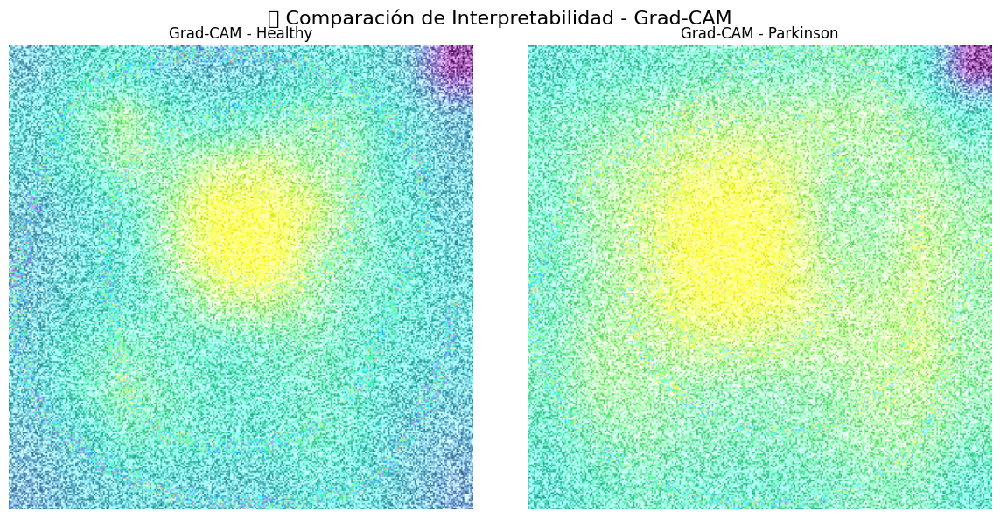

✅ Imagen guardada: /content/gradcam_comparativo_healthy_vs_parkinson.png


In [ ]:
from tf_explain.core.grad_cam import GradCAM
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf
import cv2

# 1. Cargar el modelo
model = tf.keras.models.load_model('mejor_modelo.keras')

# 2. Extraer una imagen Healthy y otra Parkinson
def get_image_by_class(dataset, class_value):
    for img, label in dataset.unbatch():
        if label.numpy() == class_value:
            img = img.numpy()
            if img.shape[-1] == 1:
                img = np.repeat(img, 3, axis=-1)
            return np.expand_dims(img, axis=0), img

img_healthy_batch, img_healthy = get_image_by_class(val_dataset, 0)
img_parkinson_batch, img_parkinson = get_image_by_class(val_dataset, 1)

# 3. Ejecutar Grad-CAM
explainer = GradCAM()

grid_healthy = explainer.explain(
    validation_data=(img_healthy_batch, None),
    model=model,
    class_index=0,
    layer_name="block7a_project_bn"
)

grid_parkinson = explainer.explain(
    validation_data=(img_parkinson_batch, None),
    model=model,
    class_index=0,
    layer_name="block7a_project_bn"
)

# 4. Visualización comparativa
fig, axs = plt.subplots(1, 2, figsize=(12, 6))

axs[0].imshow(grid_healthy)
axs[0].set_title("Grad-CAM - Healthy")
axs[0].axis('off')

axs[1].imshow(grid_parkinson)
axs[1].set_title("Grad-CAM - Parkinson")
axs[1].axis('off')

plt.suptitle("🧠 Comparación de Interpretabilidad - Grad-CAM", fontsize=16)
plt.tight_layout()
plt.savefig("/content/gradcam_comparativo_healthy_vs_parkinson.png", dpi=300, bbox_inches='tight')
plt.show()

print("✅ Imagen guardada: /content/gradcam_comparativo_healthy_vs_parkinson.png")


Superposición Grad-CAM sobre la imagen original para ambas clases

<ipython-input-34-553be938f1eb>:73: UserWarning: Glyph 129504 (\N{BRAIN}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-34-553be938f1eb>:74: UserWarning: Glyph 129504 (\N{BRAIN}) missing from font(s) DejaVu Sans.
  plt.savefig("/content/gradcam_superpuesto_healthy_vs_parkinson.png", dpi=300, bbox_inches='tight')


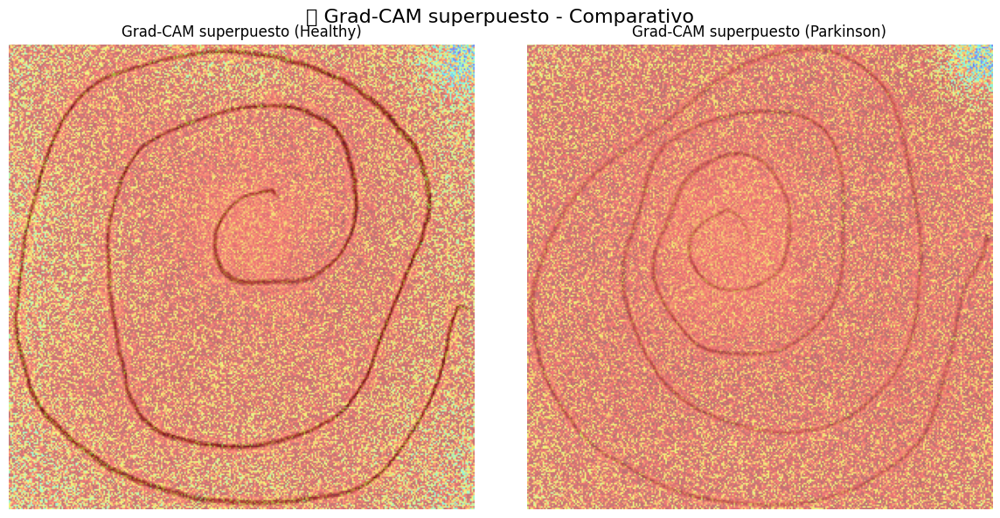

✅ Imagen comparativa guardada: /content/gradcam_superpuesto_healthy_vs_parkinson.png


In [ ]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
from tf_explain.core.grad_cam import GradCAM
import tensorflow as tf

# Cargar el modelo
model = tf.keras.models.load_model('mejor_modelo.keras')

# Función para extraer imagen de una clase
def get_image_by_class(dataset, class_value):
    for img, label in dataset.unbatch():
        if label.numpy() == class_value:
            img = img.numpy()
            if img.shape[-1] == 1:
                img = np.repeat(img, 3, axis=-1)
            return np.expand_dims(img, axis=0), img

img_healthy_batch, img_healthy = get_image_by_class(val_dataset, 0)
img_parkinson_batch, img_parkinson = get_image_by_class(val_dataset, 1)

explainer = GradCAM()

# Obtener mapas Grad-CAM
grid_healthy = explainer.explain(
    validation_data=(img_healthy_batch, None),
    model=model,
    class_index=0,  # Healthy
    layer_name="block7a_project_bn"
)
grid_parkinson = explainer.explain(
    validation_data=(img_parkinson_batch, None),
    model=model,
    class_index=0,  # Healthy vs. 1 si quieres Parkinson, pero 0 está bien si es binario
    layer_name="block7a_project_bn"
)

def overlay_gradcam(original, gradcam, alpha=0.5):
    gradcam_norm = gradcam.astype(np.float32)
    gradcam_norm = (gradcam_norm - gradcam_norm.min()) / (np.ptp(gradcam_norm) + 1e-6)
    gradcam_colormap = cv2.applyColorMap(np.uint8(255 * gradcam_norm), cv2.COLORMAP_JET)
    gradcam_colormap = cv2.cvtColor(gradcam_colormap, cv2.COLOR_BGR2RGB)
    gradcam_colormap = cv2.resize(gradcam_colormap, (original.shape[1], original.shape[0]))

    # Convert original to uint8 and 3 channels if needed
    if original.max() <= 1.0:
        original = (original * 255).astype(np.uint8)
    if original.ndim == 2:
        original = cv2.cvtColor(original, cv2.COLOR_GRAY2RGB)
    if original.shape[-1] == 1:
        original = np.repeat(original, 3, axis=-1)
    original = original.astype(np.uint8)
    gradcam_colormap = gradcam_colormap.astype(np.uint8)

    overlay = cv2.addWeighted(original, 1 - alpha, gradcam_colormap, alpha, 0)
    return overlay

# Superponer Grad-CAM en las imágenes originales
overlay_healthy = overlay_gradcam(img_healthy, grid_healthy)
overlay_parkinson = overlay_gradcam(img_parkinson, grid_parkinson)

# Graficar comparativo
fig, axs = plt.subplots(1, 2, figsize=(12, 6))
axs[0].imshow(overlay_healthy)
axs[0].set_title("Grad-CAM superpuesto (Healthy)")
axs[0].axis('off')

axs[1].imshow(overlay_parkinson)
axs[1].set_title("Grad-CAM superpuesto (Parkinson)")
axs[1].axis('off')

plt.suptitle("🧠 Grad-CAM superpuesto - Comparativo", fontsize=16)
plt.tight_layout()
plt.savefig("/content/gradcam_superpuesto_healthy_vs_parkinson.png", dpi=300, bbox_inches='tight')
plt.show()

print("✅ Imagen comparativa guardada: /content/gradcam_superpuesto_healthy_vs_parkinson.png")


<ipython-input-35-5f79142e4f3b>:85: UserWarning: Glyph 129504 (\N{BRAIN}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-35-5f79142e4f3b>:86: UserWarning: Glyph 129504 (\N{BRAIN}) missing from font(s) DejaVu Sans.
  plt.savefig("/content/gradcam_superpuesto_comparativo.png", dpi=300, bbox_inches='tight')


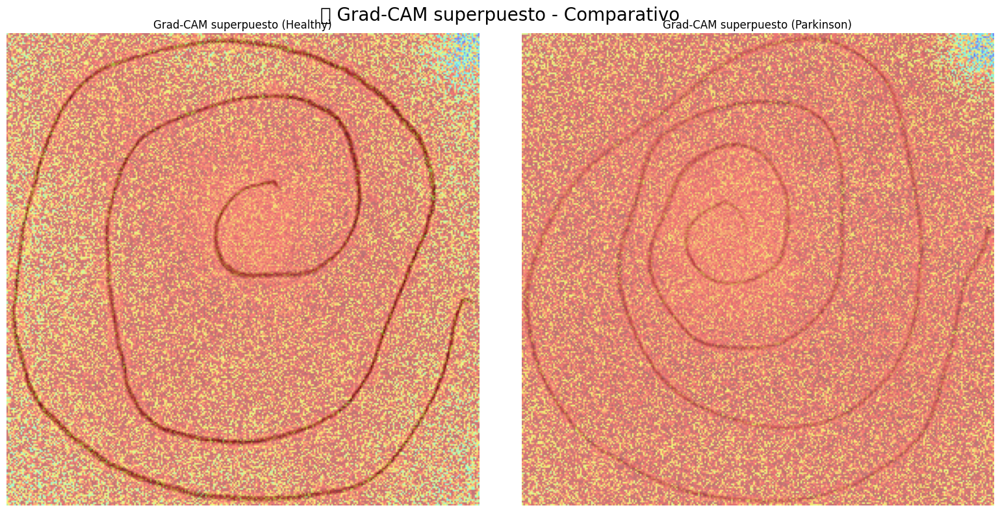

✅ Imagen comparativa guardada: /content/gradcam_superpuesto_comparativo.png


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf
import cv2
from tf_explain.core.grad_cam import GradCAM

# --- Configuración para memoria de GPU (opcional en Colab) ---
tf.keras.backend.clear_session()
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        tf.config.experimental.set_memory_growth(gpus[0], True)
    except RuntimeError:
        pass

# 1. Cargar el modelo fine-tuned
model = tf.keras.models.load_model('mejor_modelo.keras')

# 2. Función para obtener una imagen por clase
def get_image_by_class(dataset, class_value):
    for img, label in dataset.unbatch():
        if label.numpy() == class_value:
            img = img.numpy()
            if img.shape[-1] == 1:
                img = np.repeat(img, 3, axis=-1)
            return np.expand_dims(img, axis=0), img
    return None, None

# 3. Obtener una imagen de cada clase
img_healthy_batch, img_healthy = get_image_by_class(val_dataset, 0)
img_parkinson_batch, img_parkinson = get_image_by_class(val_dataset, 1)

# 4. Ejecutar Grad-CAM para ambas imágenes
explainer = GradCAM()
grid_healthy = explainer.explain(
    validation_data=(img_healthy_batch, None),
    model=model,
    class_index=0,  # 0 para Healthy
    layer_name="block7a_project_bn"  # Ajusta según tu modelo
)
grid_parkinson = explainer.explain(
    validation_data=(img_parkinson_batch, None),
    model=model,
    class_index=0,  # 0 para Healthy (puedes poner 1 para comparar la clase opuesta)
    layer_name="block7a_project_bn"
)

# 5. Función para superponer Grad-CAM
def overlay_gradcam(original, gradcam, alpha=0.5):
    gradcam_norm = gradcam.astype(np.float32)
    gradcam_norm = (gradcam_norm - gradcam_norm.min()) / (np.ptp(gradcam_norm) + 1e-6)
    gradcam_colormap = cv2.applyColorMap(np.uint8(255 * gradcam_norm), cv2.COLORMAP_JET)
    gradcam_colormap = cv2.cvtColor(gradcam_colormap, cv2.COLOR_BGR2RGB)
    gradcam_colormap = cv2.resize(gradcam_colormap, (original.shape[1], original.shape[0]))

    # Convertir original a uint8 y 3 canales si es necesario
    if original.max() <= 1.0:
        original = (original * 255).astype(np.uint8)
    if original.ndim == 2:
        original = cv2.cvtColor(original, cv2.COLOR_GRAY2RGB)
    if original.shape[-1] == 1:
        original = np.repeat(original, 3, axis=-1)
    original = original.astype(np.uint8)
    gradcam_colormap = gradcam_colormap.astype(np.uint8)

    overlay = cv2.addWeighted(original, 1 - alpha, gradcam_colormap, alpha, 0)
    return overlay

# 6. Superponer Grad-CAM sobre las imágenes originales
overlay_healthy = overlay_gradcam(img_healthy, grid_healthy)
overlay_parkinson = overlay_gradcam(img_parkinson, grid_parkinson)

# 7. Visualización comparativa
fig, axs = plt.subplots(1, 2, figsize=(16, 8))

axs[0].imshow(overlay_healthy)
axs[0].set_title("Grad-CAM superpuesto (Healthy)")
axs[0].axis('off')

axs[1].imshow(overlay_parkinson)
axs[1].set_title("Grad-CAM superpuesto (Parkinson)")
axs[1].axis('off')

plt.suptitle("🧠 Grad-CAM superpuesto - Comparativo", fontsize=20)
plt.tight_layout()
plt.savefig("/content/gradcam_superpuesto_comparativo.png", dpi=300, bbox_inches='tight')
plt.show()

print("✅ Imagen comparativa guardada: /content/gradcam_superpuesto_comparativo.png")


In [ ]:
!http://googleusercontent.com/image_generation_content/0

/bin/bash: line 1: http://googleusercontent.com/image_generation_content/0: No such file or directory


# **IG - Mejorado**

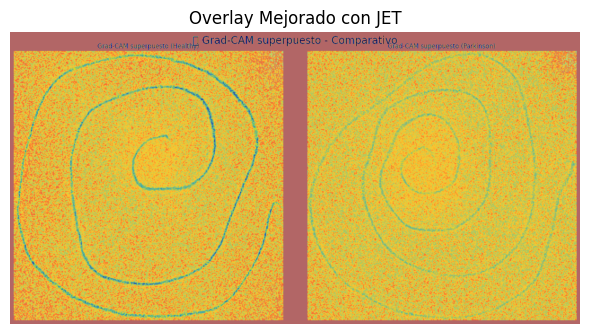

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize

# 1) Carga de imágenes
# - original: tu dibujo de espiral u onda (RGB)
# - heatmap: el PNG que generaste de Integrated Gradients o Grad-CAM (escala de grises)
orig_bgr = cv2.imread('/content/drive/MyDrive/ProyectoCESUMA/mejorado2.png', cv2.IMREAD_COLOR)
heat_gray = cv2.imread('/content/drive/MyDrive/ProyectoCESUMA/mejorado2.png', cv2.IMREAD_GRAYSCALE)

# Convertir original BGR→RGB y a float [0,1]
orig = cv2.cvtColor(orig_bgr, cv2.COLOR_BGR2RGB).astype(np.float32) / 255.0

# 2) Normalizar y colorear el heatmap
norm = Normalize(vmin=heat_gray.min(), vmax=heat_gray.max())
heat_colored = plt.cm.jet(norm(heat_gray))[:, :, :3]  # devuelve float [0,1] en RGB

# 3) Superponer con alpha
alpha = 0.6  # ajústalo entre 0 (solo original) y 1 (solo heatmap)
overlay = orig * (1 - alpha) + heat_colored * alpha
overlay = np.clip(overlay, 0, 1)

# 4) Mostrar y guardar
plt.figure(figsize=(6,6))
plt.imshow(overlay)
plt.axis('off')
plt.title("Overlay Mejorado con JET")
plt.tight_layout()
plt.savefig('/content/overlay_mejorado.png', dpi=300, bbox_inches='tight')
plt.show()
